In [37]:
import numpy as np
import pandas as pd
from itertools import product
import scipy.stats as ss
import math
from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer
import re
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap
from sentence_transformers import SentenceTransformer
# sklearn 
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report, davies_bouldin_score, calinski_harabasz_score
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn import metrics
import time

In [8]:
df=pd.read_csv(r'C:\Users\Dell\Documents\projects\customer segmentation\online_Marketing_campaign.csv')
df=df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

### Loading the dataset and renaming the columns

In [9]:
df

,campaign_item_id,no_of_days,time,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,...,exchange_rate,media_cost_usd,position_in_content,unique_reach,total_reach,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords
0,2733,7,2022-05-01,128,Facebook Ads,1000,300.0,250.0,#The Power of X,90.0,...,1,14.058514,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_end,delicate bracelets
1,2733,8,2022-05-02,16,DV360,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,99.633496,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,summer jewelry
2,2733,9,2022-05-03,128,Facebook Ads,1000,300.0,250.0,#Embrace Your Individuality with X,90.0,...,1,109.419677,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,artisan jewelry
3,2733,10,2022-05-04,128,Facebook Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,115.209499,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,layered bracelets
4,2733,11,2022-05-05,4,Google Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,66.990104,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,minimalist jewelry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72607,3567,11,2022-11-28,4,Google Ads,15605,NaN,NaN,#The X Factor - Fashion for the Fearless,NaN,...,1,4.858090,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,chic jewelry
72608,3567,12,2022-11-29,128,Facebook Ads,15605,NaN,NaN,#Embrace Your Individuality with X,NaN,...,1,3.536262,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,statement pins
72609,3567,13,2022-11-30,128,Facebook Ads,15605,NaN,NaN,#The Power of X,NaN,...,1,1.947816,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,bridal jewelry
72610,3567,14,2022-12-01,4,Google Ads,15605,NaN,NaN,#Embrace Your Individuality with X,NaN,...,1,1.711467,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,jewelry sets


In [10]:
df.columns

Index(['campaign_item_id', 'no_of_days', 'time', 'ext_service_id',
       'ext_service_name', 'creative_id', 'creative_width', 'creative_height',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'approved_budget',
       'advertiser_currency', 'channel_id', 'channel_name', 'max_bid_cpm',
       'network_margin', 'campaign_budget_usd', 'impressions', 'clicks',
       'stats_currency', 'currency_code', 'exchange_rate', 'media_cost_usd',
       'position_in_content', 'unique_reach', 'total_reach', 'search_tag_cat',
       'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords'],
      dtype='object')

In [11]:
df.dtypes

campaign_item_id         int64
no_of_days               int64
time                    object
ext_service_id           int64
ext_service_name        object
creative_id              int64
creative_width         float64
creative_height        float64
search_tags             object
template_id            float64
landing_page            object
advertiser_id            int64
advertiser_name         object
network_id               int64
approved_budget        float64
advertiser_currency     object
channel_id               int64
channel_name            object
max_bid_cpm            float64
network_margin         float64
campaign_budget_usd    float64
impressions              int64
clicks                   int64
stats_currency          object
currency_code           object
exchange_rate            int64
media_cost_usd         float64
position_in_content    float64
unique_reach           float64
total_reach            float64
search_tag_cat          object
cmi_currency_code       object
timezone

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72612 entries, 0 to 72611
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     72612 non-null  int64  
 1   no_of_days           72612 non-null  int64  
 2   time                 72612 non-null  object 
 3   ext_service_id       72612 non-null  int64  
 4   ext_service_name     72612 non-null  object 
 5   creative_id          72612 non-null  int64  
 6   creative_width       69200 non-null  float64
 7   creative_height      69200 non-null  float64
 8   search_tags          72612 non-null  object 
 9   template_id          69200 non-null  float64
 10  landing_page         72612 non-null  object 
 11  advertiser_id        72612 non-null  int64  
 12  advertiser_name      72612 non-null  object 
 13  network_id           72612 non-null  int64  
 14  approved_budget      72206 non-null  float64
 15  advertiser_currency  72612 non-null 

In [13]:
new=df.drop(columns=['position_in_content', 'unique_reach', 'total_reach','network_margin'])

#### Removing due to being constant throughout

In [14]:
new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72612 entries, 0 to 72611
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     72612 non-null  int64  
 1   no_of_days           72612 non-null  int64  
 2   time                 72612 non-null  object 
 3   ext_service_id       72612 non-null  int64  
 4   ext_service_name     72612 non-null  object 
 5   creative_id          72612 non-null  int64  
 6   creative_width       69200 non-null  float64
 7   creative_height      69200 non-null  float64
 8   search_tags          72612 non-null  object 
 9   template_id          69200 non-null  float64
 10  landing_page         72612 non-null  object 
 11  advertiser_id        72612 non-null  int64  
 12  advertiser_name      72612 non-null  object 
 13  network_id           72612 non-null  int64  
 14  approved_budget      72206 non-null  float64
 15  advertiser_currency  72612 non-null 

In [15]:
new['max_bid_cpm'].fillna('0',inplace=True)

In [16]:
new.dropna(inplace=True)
new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   no_of_days           68880 non-null  int64  
 2   time                 68880 non-null  object 
 3   ext_service_id       68880 non-null  int64  
 4   ext_service_name     68880 non-null  object 
 5   creative_id          68880 non-null  int64  
 6   creative_width       68880 non-null  float64
 7   creative_height      68880 non-null  float64
 8   search_tags          68880 non-null  object 
 9   template_id          68880 non-null  float64
 10  landing_page         68880 non-null  object 
 11  advertiser_id        68880 non-null  int64  
 12  advertiser_name      68880 non-null  object 
 13  network_id           68880 non-null  int64  
 14  approved_budget      68880 non-null  float64
 15  advertiser_currency  68880 non-null 

In [44]:
num_col=['no_of_days','creative_width','creative_height','approved_budget','campaign_budget_usd','impressions','clicks','exchange_rate','media_cost_usd']

### We replaced null values with '0' and dropped all other useless rows

In [17]:
new = new.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

#### Renaming the columns

In [18]:
new=new.drop(columns=['time'])

#### Dropping time as it's useless for our analysis.

In [19]:
new1=new.copy()

In [20]:
new1['i']=new1.index

In [21]:
new1

,campaign_item_id,no_of_days,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,landing_page,...,stats_currency,currency_code,exchange_rate,media_cost_usd,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords,i
0,2733,7,128,Facebook Ads,1000,300.0,250.0,#The Power of X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,SGD,SGD,1,14.058514,Others,SGD,Asia/Singapore,week_end,delicate bracelets,0
1,2733,8,16,DV360,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/costume-jewelry/,...,SGD,SGD,1,99.633496,Others,SGD,Asia/Singapore,week_day,summer jewelry,1
2,2733,9,128,Facebook Ads,1000,300.0,250.0,#Embrace Your Individuality with X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,SGD,SGD,1,109.419677,Others,SGD,Asia/Singapore,week_day,artisan jewelry,2
3,2733,10,128,Facebook Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/rhinest...,...,SGD,SGD,1,115.209499,Others,SGD,Asia/Singapore,week_day,layered bracelets,3
4,2733,11,4,Google Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,SGD,SGD,1,66.990104,Others,SGD,Asia/Singapore,week_day,minimalist jewelry,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,3960,2,128,Facebook Ads,13710,300.0,250.0,#The Ultimate Fashion Statement with X,90.0,https://www.abcjewelry.com/collections/rhinest...,...,USD,USD,1,20.419520,Inmarket,USD,Asia/Muscat,week_day,chunky jewelry,69195
69196,3960,3,128,Facebook Ads,13710,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/designer-insp...,...,USD,USD,1,18.950320,Inmarket,USD,Asia/Muscat,week_end,luxury jewelry,69196
69197,3960,4,128,Facebook Ads,13710,300.0,250.0,#Timeless X Style,90.0,https://www.abcjewelry.com/women/fashion-jewelry,...,USD,USD,1,16.460140,Inmarket,USD,Asia/Muscat,week_day,everyday jewelry,69197
69198,3960,5,128,Facebook Ads,13710,300.0,250.0,#The X Factor - Fashion for the Fearless,90.0,https://www.abcjewelry.com/collections/boho-je...,...,USD,USD,1,16.374037,Inmarket,USD,Asia/Muscat,week_day,dazzling jewelry,69198


In [22]:
bf_df=new.copy()

In [19]:
new = pd.get_dummies(new, columns=['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords'])

### one-hot encoding categorical features

In [104]:
new

,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd,campaign_item_id_2733,...,keywords_unique and trendy jewelry,keywords_unique jewelry,keywords_vibrant jewelry,keywords_victorian jewelry,keywords_vintage jewelry,keywords_vintage-inspired jewelry,keywords_wedding jewelry,keywords_whimsical jewelry,keywords_winter jewelry,keywords_zodiac jewelry
0,7,300.0,250.0,400.0,652.173913,837,8,1,14.058514,1,...,0,0,0,0,0,0,0,0,0,0
1,8,300.0,250.0,400.0,652.173913,2634,44,1,99.633496,1,...,0,0,0,0,0,0,0,0,0,0
2,9,300.0,250.0,400.0,652.173913,2135,32,1,109.419677,1,...,0,0,0,0,0,0,0,0,0,0
3,10,300.0,250.0,400.0,652.173913,2327,48,1,115.209499,1,...,0,0,0,0,0,0,0,0,0,0
4,11,300.0,250.0,400.0,652.173913,1538,20,1,66.990104,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,2,300.0,250.0,8434.0,600.000000,1274,12,1,20.419520,0,...,0,0,0,0,0,0,0,0,0,0
69196,3,300.0,250.0,8434.0,600.000000,1210,7,1,18.950320,0,...,0,0,0,0,0,0,0,0,0,0
69197,4,300.0,250.0,8434.0,600.000000,1153,25,1,16.460140,0,...,0,0,0,0,0,0,0,0,0,0
69198,5,300.0,250.0,8434.0,600.000000,1156,11,1,16.374037,0,...,0,0,0,0,0,0,0,0,0,0


In [105]:
new['i']=new.index
sam=new.drop(columns=['i'])

In [106]:
sen=sam.copy()

In [107]:
sen['i']=sen.index

In [108]:
print(new.iloc[:,[2990]])

           i
0          0
1          1
2          2
3          3
4          4
...      ...
69195  69195
69196  69196
69197  69197
69198  69198
69199  69199

[68880 rows x 1 columns]


In [109]:
print(sen['outliers'].unique())

KeyError: 'outliers'

In [110]:
clf10 = ECOD()
clf10.fit(sen.iloc[:,:-1])
outliers = clf10.predict(sen.iloc[:,:-1]) 

sen["outliers"] = outliers

# Data without outliers
data_no_outliers = sen[sen["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

# Data with Outliers
data_with_outliers = sen.copy()
data_with_outliers = data_with_outliers.drop(["outliers"], axis = 1)

print(data_no_outliers.shape) 
print(data_with_outliers.shape) 
print(1)

C:\Users\Dell\anaconda3\lib\site-packages\pyod\models\ecod.py:25: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



(61992, 2991)
(68880, 2991)
1


### Tried to remove outliers above

In [111]:
print(data_no_outliers.shape)

print(data_with_outliers.shape)

(61992, 2991)
(68880, 2991)


In [112]:
new


,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd,campaign_item_id_2733,...,keywords_unique jewelry,keywords_vibrant jewelry,keywords_victorian jewelry,keywords_vintage jewelry,keywords_vintage-inspired jewelry,keywords_wedding jewelry,keywords_whimsical jewelry,keywords_winter jewelry,keywords_zodiac jewelry,i
0,7,300.0,250.0,400.0,652.173913,837,8,1,14.058514,1,...,0,0,0,0,0,0,0,0,0,0
1,8,300.0,250.0,400.0,652.173913,2634,44,1,99.633496,1,...,0,0,0,0,0,0,0,0,0,1
2,9,300.0,250.0,400.0,652.173913,2135,32,1,109.419677,1,...,0,0,0,0,0,0,0,0,0,2
3,10,300.0,250.0,400.0,652.173913,2327,48,1,115.209499,1,...,0,0,0,0,0,0,0,0,0,3
4,11,300.0,250.0,400.0,652.173913,1538,20,1,66.990104,1,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,2,300.0,250.0,8434.0,600.000000,1274,12,1,20.419520,0,...,0,0,0,0,0,0,0,0,0,69195
69196,3,300.0,250.0,8434.0,600.000000,1210,7,1,18.950320,0,...,0,0,0,0,0,0,0,0,0,69196
69197,4,300.0,250.0,8434.0,600.000000,1153,25,1,16.460140,0,...,0,0,0,0,0,0,0,0,0,69197
69198,5,300.0,250.0,8434.0,600.000000,1156,11,1,16.374037,0,...,0,0,0,0,0,0,0,0,0,69198


In [113]:
check=list(data_no_outliers['i'])
vals=new[new['i'].isin(check) ]

In [114]:
new1=new1[new1['i'].isin(check) ]

In [115]:
new1

,campaign_item_id,no_of_days,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,landing_page,...,stats_currency,currency_code,exchange_rate,media_cost_usd,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords,i
8,2766,56,16,DV360,1005,0.0,0.0,#The X Factor - Fashion for the Fearless,23.0,https://www.abcjewelry.com/collections/bold-je...,...,USD,USD,1,5.409166,Youtube,USD,America/New_York,week_day,clip-on earrings,8
9,2766,57,128,Facebook Ads,1005,0.0,0.0,#Be Bold. Be X,23.0,https://www.abcjewelry.com/collections/hoop-ea...,...,USD,USD,1,5.965384,Youtube,USD,America/New_York,week_day,bohemian jewelry,9
11,2766,59,128,Facebook Ads,1005,0.0,0.0,#Timeless X Style,23.0,https://www.abcjewelry.com/collections/layered...,...,USD,USD,1,6.554380,Youtube,USD,America/New_York,week_day,layered jewelry,11
12,2766,60,4,Google Ads,1005,0.0,0.0,#Be Bold. Be X,23.0,https://www.abcjewelry.com/women/costume-jewelry/,...,USD,USD,1,4.690084,Youtube,USD,America/New_York,week_day,tribal jewelry,12
13,2766,61,16,DV360,1005,0.0,0.0,#The X Factor - Fashion for the Fearless,23.0,https://www.abcjewelry.com/collections/cuff-br...,...,USD,USD,1,11.652413,Youtube,USD,America/New_York,week_day,artisan jewelry,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69125,3558,3,128,Facebook Ads,13655,300.0,250.0,#The X Factor - Fashion for the Fearless,90.0,https://www.abcjewelry.com/women/vintage-inspi...,...,INR,INR,1,0.690429,Others,INR,Asia/Kolkata,week_day,renaissance jewelry,69125
69126,3558,4,16,DV360,13655,300.0,250.0,#Timeless X Style,90.0,https://www.abcjewelry.com/collections/delicat...,...,INR,INR,1,1.317755,Others,INR,Asia/Kolkata,week_end,handmade jewelry,69126
69127,3558,5,128,Facebook Ads,13655,300.0,250.0,#The Ultimate Fashion Statement with X,90.0,https://www.abcjewelry.com/collections/designe...,...,INR,INR,1,2.490972,Others,INR,Asia/Kolkata,week_day,art nouveau jewelry,69127
69128,3558,6,4,Google Ads,13655,300.0,250.0,#Embrace Your Individuality with X,90.0,https://www.abcjewelry.com/collections/bold-je...,...,INR,INR,1,3.416964,Others,INR,Asia/Kolkata,week_day,wedding jewelry,69128


In [116]:
vals=vals.drop(columns=['i'])

In [117]:
new1.columns

Index(['campaign_item_id', 'no_of_days', 'ext_service_id', 'ext_service_name',
       'creative_id', 'creative_width', 'creative_height', 'search_tags',
       'template_id', 'landing_page', 'advertiser_id', 'advertiser_name',
       'network_id', 'approved_budget', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'campaign_budget_usd', 'impressions',
       'clicks', 'stats_currency', 'currency_code', 'exchange_rate',
       'media_cost_usd', 'search_tag_cat', 'cmi_currency_code', 'timezone',
       'weekday_cat', 'keywords', 'i'],
      dtype='object')

In [23]:
def compile_text(x):

    text =  f"""campaign_item_id: {x['campaign_item_id']},  
                no_of_days: {x['no_of_days']}, 
                ext_service_id: {x['ext_service_id']}, 
                ext_service_name: {x['ext_service_name']}, 
                creative_id: {x['creative_id']}, 
                creative_width: {x['creative_width']}, 
                creative_height: {x['creative_height']}, 
                search_tags: {x['search_tags']},
                template_id: {x['template_id']},
                landing_page: {x['landing_page']},
                advertiser_id: {x['advertiser_id']},
                advertiser_name: {x['advertiser_name']},
                network_id: {x['network_id']},
                approved_budget: {x['approved_budget']},
                advertiser_currency: {x['advertiser_currency']},
                channel_id: {x['channel_id']},
                channel_name: {x['channel_name']},
                max_bid_cpm: {x['max_bid_cpm']},
                campaign_budget_usd: {x['campaign_budget_usd']},
                impressions: {x['impressions']},
                clicks: {x['clicks']},
                stats_currency: {x['stats_currency']},
                currency_code: {x['currency_code']},
                exchange_rate: {x['exchange_rate']},
                media_cost_usd: {x['media_cost_usd']},
                search_tag_cat: {x['search_tag_cat']},
                cmi_currency_code: {x['cmi_currency_code']},
                timezone: {x['timezone']},
                weekday_cat: {x['weekday_cat']},
                keywords: {x['keywords']},
                
            """

    return text

sentences = bf_df.apply(lambda x: compile_text(x), axis=1).tolist()

In [29]:
bf_df

,campaign_item_id,no_of_days,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,landing_page,...,clicks,stats_currency,currency_code,exchange_rate,media_cost_usd,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords
0,2733,7,128,Facebook Ads,1000,300.0,250.0,#The Power of X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,8,SGD,SGD,1,14.058514,Others,SGD,Asia/Singapore,week_end,delicate bracelets
1,2733,8,16,DV360,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/costume-jewelry/,...,44,SGD,SGD,1,99.633496,Others,SGD,Asia/Singapore,week_day,summer jewelry
2,2733,9,128,Facebook Ads,1000,300.0,250.0,#Embrace Your Individuality with X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,32,SGD,SGD,1,109.419677,Others,SGD,Asia/Singapore,week_day,artisan jewelry
3,2733,10,128,Facebook Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/rhinest...,...,48,SGD,SGD,1,115.209499,Others,SGD,Asia/Singapore,week_day,layered bracelets
4,2733,11,4,Google Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/boho-je...,...,20,SGD,SGD,1,66.990104,Others,SGD,Asia/Singapore,week_day,minimalist jewelry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,3960,2,128,Facebook Ads,13710,300.0,250.0,#The Ultimate Fashion Statement with X,90.0,https://www.abcjewelry.com/collections/rhinest...,...,12,USD,USD,1,20.419520,Inmarket,USD,Asia/Muscat,week_day,chunky jewelry
69196,3960,3,128,Facebook Ads,13710,300.0,250.0,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/designer-insp...,...,7,USD,USD,1,18.950320,Inmarket,USD,Asia/Muscat,week_end,luxury jewelry
69197,3960,4,128,Facebook Ads,13710,300.0,250.0,#Timeless X Style,90.0,https://www.abcjewelry.com/women/fashion-jewelry,...,25,USD,USD,1,16.460140,Inmarket,USD,Asia/Muscat,week_day,everyday jewelry
69198,3960,5,128,Facebook Ads,13710,300.0,250.0,#The X Factor - Fashion for the Fearless,90.0,https://www.abcjewelry.com/collections/boho-je...,...,11,USD,USD,1,16.374037,Inmarket,USD,Asia/Muscat,week_day,dazzling jewelry


### Converting each row of the dta into sentence so that we can use to find sentence embeddings

In [24]:
len(sentences)

68880

In [25]:
sentences

['campaign_item_id: 2733,  \n                no_of_days: 7, \n                ext_service_id: 128, \n                ext_service_name: Facebook Ads, \n                creative_id: 1000, \n                creative_width: 300.0, \n                creative_height: 250.0, \n                search_tags: #The Power of X,\n                template_id: 90.0,\n                landing_page: https://www.abcjewelry.com/collections/boho-jewelry-for-women,\n                advertiser_id: 4756,\n                advertiser_name: Web,\n                network_id: 190,\n                approved_budget: 400.0,\n                advertiser_currency: SGD,\n                channel_id: 32,\n                channel_name: Mobile,\n                max_bid_cpm: 0,\n                campaign_budget_usd: 652.173913,\n                impressions: 837,\n                clicks: 8,\n                stats_currency: SGD,\n                currency_code: SGD,\n                exchange_rate: 1,\n                media_cost_us

In [26]:
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

In [27]:
output = model.encode(sentences=sentences,
         show_progress_bar=True,
         normalize_embeddings=True)

df_embedding = pd.DataFrame(output)
df_embedding

Batches:   0%|          | 0/2153 [00:00<?, ?it/s]

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.046619,-0.000238,-0.042193,0.037243,-0.018479,-0.042185,0.083059,-0.037481,-0.029770,-0.018776,...,0.010937,-0.019541,0.097470,0.082033,0.076440,0.102910,0.125675,-0.149290,-0.051969,0.007468
1,-0.022963,0.051447,0.023944,0.020872,-0.050076,-0.040158,0.085915,-0.061596,-0.013734,-0.018532,...,-0.014145,-0.026847,0.073744,0.121316,0.031783,0.101049,0.079559,-0.150204,-0.080662,-0.014087
2,-0.042536,0.011679,-0.038611,0.042234,-0.015500,-0.042618,0.100528,-0.038021,-0.031582,-0.027864,...,-0.000577,-0.016898,0.103077,0.079417,0.077700,0.112092,0.127823,-0.143673,-0.047383,0.013989
3,-0.023979,0.025250,-0.025906,0.047798,-0.022981,-0.029168,0.075668,-0.040680,-0.038970,-0.044052,...,-0.017327,-0.012016,0.092408,0.109101,0.067437,0.072475,0.116503,-0.155368,-0.062986,0.001729
4,-0.038601,0.029891,-0.009418,0.030959,-0.028435,-0.050938,0.071399,-0.047919,-0.020620,-0.034678,...,0.018243,-0.011963,0.086364,0.067063,0.052892,0.084625,0.110091,-0.140890,-0.078274,0.007494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68875,-0.027721,0.056890,0.005869,0.042137,-0.024917,-0.038422,0.073967,-0.061081,-0.061924,-0.042033,...,-0.028960,-0.042723,0.056950,0.119403,0.101923,0.097595,0.146680,-0.166299,-0.059750,0.020892
68876,-0.028748,0.033453,-0.007442,0.028791,-0.006981,-0.061211,0.068891,-0.085314,-0.046302,-0.008219,...,-0.012637,-0.052169,0.053879,0.124063,0.087289,0.087385,0.126915,-0.131710,-0.067747,0.008017
68877,-0.024549,0.032596,0.007727,0.006990,0.004226,-0.032282,0.038063,-0.065278,-0.053365,-0.003248,...,-0.006650,-0.046611,0.033839,0.118466,0.079530,0.095947,0.121154,-0.131186,-0.064717,0.019850
68878,-0.015395,0.054990,-0.040938,0.009545,0.006675,-0.041454,0.110893,-0.073179,-0.048276,0.001285,...,0.008694,-0.041075,0.072359,0.081840,0.095510,0.123329,0.154114,-0.140692,-0.050208,0.028271


### Encoding the sentences into embeddings and storing it as a dataframe

In [ ]:
df_embedding.to_csv(r"C:\Users\Dell\Documents\projects\customer segmentation\df_embedding.csv",index=False)

### Saving our embeddings into a csv file

In [4]:
df_embedding=pd.read_csv(r"C:\Users\Dell\Documents\projects\customer segmentation\df_embedding.csv")

### Loading our saved embeddings

In [28]:
df_embedding

,0,1,2,3,4,5,6,7,8,9,...,374,375,376,377,378,379,380,381,382,383
0,-0.046619,-0.000238,-0.042193,0.037243,-0.018479,-0.042185,0.083059,-0.037481,-0.029770,-0.018776,...,0.010937,-0.019541,0.097470,0.082033,0.076440,0.102910,0.125675,-0.149290,-0.051969,0.007468
1,-0.022963,0.051447,0.023944,0.020872,-0.050076,-0.040158,0.085915,-0.061596,-0.013734,-0.018532,...,-0.014145,-0.026847,0.073744,0.121316,0.031783,0.101049,0.079559,-0.150204,-0.080662,-0.014087
2,-0.042536,0.011679,-0.038611,0.042234,-0.015500,-0.042618,0.100528,-0.038021,-0.031582,-0.027864,...,-0.000577,-0.016898,0.103077,0.079417,0.077700,0.112092,0.127823,-0.143673,-0.047383,0.013989
3,-0.023979,0.025250,-0.025906,0.047798,-0.022981,-0.029168,0.075668,-0.040680,-0.038970,-0.044052,...,-0.017327,-0.012016,0.092408,0.109101,0.067437,0.072475,0.116503,-0.155368,-0.062986,0.001729
4,-0.038601,0.029891,-0.009418,0.030959,-0.028435,-0.050938,0.071399,-0.047919,-0.020620,-0.034678,...,0.018243,-0.011963,0.086364,0.067063,0.052892,0.084625,0.110091,-0.140890,-0.078274,0.007494
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68875,-0.027721,0.056890,0.005869,0.042137,-0.024917,-0.038422,0.073967,-0.061081,-0.061924,-0.042033,...,-0.028960,-0.042723,0.056950,0.119403,0.101923,0.097595,0.146680,-0.166299,-0.059750,0.020892
68876,-0.028748,0.033453,-0.007442,0.028791,-0.006981,-0.061211,0.068891,-0.085314,-0.046302,-0.008219,...,-0.012637,-0.052169,0.053879,0.124063,0.087289,0.087385,0.126915,-0.131710,-0.067747,0.008017
68877,-0.024549,0.032596,0.007727,0.006990,0.004226,-0.032282,0.038063,-0.065278,-0.053365,-0.003248,...,-0.006650,-0.046611,0.033839,0.118466,0.079530,0.095947,0.121154,-0.131186,-0.064717,0.019850
68878,-0.015395,0.054990,-0.040938,0.009545,0.006675,-0.041454,0.110893,-0.073179,-0.048276,0.001285,...,0.008694,-0.041075,0.072359,0.081840,0.095510,0.123329,0.154114,-0.140692,-0.050208,0.028271


No 'knee' or 'elbow point' detected This could be due to bad clustering, no actual clusters being formed etc.
No 'knee' or 'elbow' point detected, pass `locate_elbow=False` to remove the warning


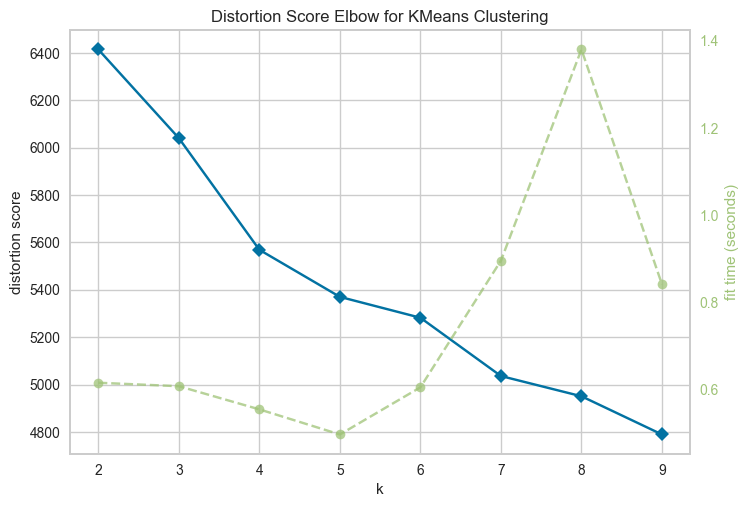

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [50]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10))
 
visualizer.fit(df_embedding)        # Fit the data to the visualizer
visualizer.show() 

### Fitting the embeddings into a Kmeans model and trying out clusters (2,10) and check which one is the best fit using elbow method. after trying out a few options we're sticking to no 3. 

In [30]:
n_clusters = 3
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding)

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


6633.720703125


In [ ]:
### Final predictions for the srentence embeddings.

In [67]:
print(clusters_predict.shape)

(61992,)


In [68]:
"""
The Davies Bouldin index is defined as the average similarity measure 
of each cluster with its most similar cluster, where similarity 
is the ratio of within-cluster distances to between-cluster distances.

The minimum value of the DB Index is 0, whereas a smaller 
value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.

Calinski Harabaz Index is defined as the ratio of the 
sum of between-cluster dispersion and of within-cluster dispersion.

The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of 
fit of a clustering algorithm, but can also be used as 
a method for determining an optimal value of k (see here for more).

Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either
the data or the value of k is incorrect.

1 is the ideal value and indicates that clusters are very 
dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(data_no_outliers,clusters_predict)}")


print("order: lesser,more,near 1")


Davies bouldin score: 170.95086963892987
Calinski Score: 0.19200096073684766


KeyboardInterrupt: 

### we got the best values for 3 clusters. But even they are not optimal values. so, possibly we may not get a good seperation of values. let's see..

In [121]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(
          df, 
          x='comp1', 
          y='comp2', 
          z='comp3',
          color='cluster',
          template="plotly",
          
          # symbol = "cluster",
          
          color_discrete_sequence=px.colors.qualitative.Vivid,
          title=title).update_traces(
              # mode = 'markers',
              marker={
                  "size": 4,
                  "opacity": opacity,
                  # "symbol" : "diamond",
                  "line": {
                      "width": width_line,
                      "color": "black",
                  }
              }
          ).update_layout(
                  width = 800, 
                  height = 800, 
                  autosize = True, 
                  showlegend = True,
                  legend=dict(title_font_family="Times New Roman",
                              font=dict(size= 20)),
                  scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                              yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                              zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                  font = dict(family = "Gilroy", color  = 'black', size = 15))
        
    
    fig.show()


In [122]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             46.340        12.07%                     12.07%
1             37.025         9.64%                     21.71%
2             29.855         7.77%                     29.48%


### ploting pca_3d graph for the data. we've cumulative variance of around 30%. Even though this is better than the previous one this has nothing to do with the lgbm predictions, so, we'll see which of the lgbm classifier we should be considering. 

### Note: we used pca only to check the clusters on a 3d plot and check how well the clusters are seperated visually. not to verify the correctness of lgbm's

In [31]:
new_names = {col: re.sub(r'[^A-Za-z0-9_]+', '', col) for col in bf_df.columns}
new_n_list = list(new_names.values())
# [LightGBM] Feature appears more than one time error.
new_names = {col: f'{new_col}_{i}' if new_col in new_n_list[:i] else new_col for i, (col, new_col) in enumerate(new_names.items())}
bf_df = bf_df.rename(columns=new_names)

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011045 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4224
[LightGBM] [Info] Number of data points in the train set: 61992, number of used features: 1535
[LightGBM] [Info] Start training from score -1.095086
[LightGBM] [Info] Start training from score -1.135030
[LightGBM] [Info] Start training from score -1.066891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


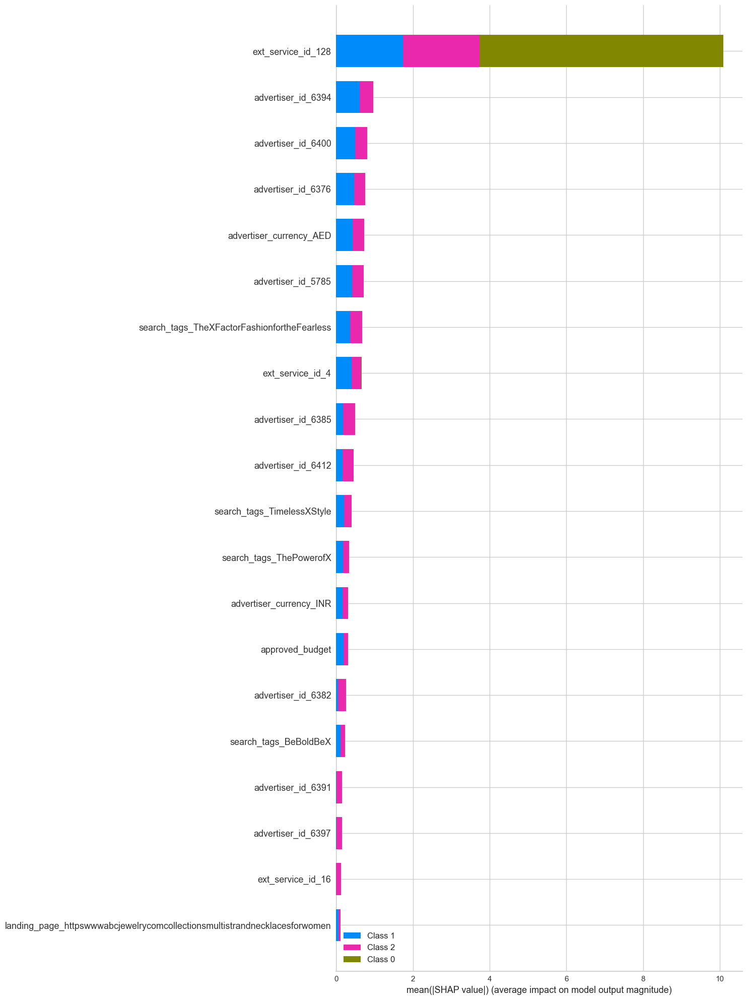

In [146]:
# We create the LGBMClassifier model and train it
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)
clf_km.fit(X=data_no_outliers, y=clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(data_no_outliers)
shap.summary_plot(shap_values_km, data_no_outliers, plot_type="bar", plot_size=(15, 20))

### AS per this lgbm AdvertiserId, external service Id, search tags had the highest say in clustering. ;et's see how true is this in our further analysis.
### we'll device other methods to decide which of the lgbm to consider in motebook 1.

In [35]:
for c in bf_df.columns:
    col_type = bf_df[c].dtype
    if col_type == 'object' or col_type.name == 'category':
        bf_df[c] = bf_df[c].astype('category')
#Train/test split
X_train, X_test, y_train, y_test = train_test_split(bf_df, clusters_predict, test_size=0.2, random_state=101, stratify=clusters_predict)



In [38]:
start = time.time()
model = lgb.LGBMClassifier(loss_function= 'Logloss', custom_metric=['Accuracy','AUC'],eval_metric='F1')
model.fit(X_train, y_train, eval_set=(X_test, y_test), feature_name='auto', categorical_feature = 'auto')
model_elapse = time.time() - start
print('elapse:, ', model_elapse)
print(); print(model)

[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004428 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1895
[LightGBM] [Info] Number of data points in the train set: 55104, number of used features: 29
[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Start training from score -1.235572
[LightGBM] [Info] Start training from score -1.096600
[LightGBM] [Info] Start training from score -0.979959
[Ligh

In [39]:
y_pred = model.predict(X_test)
# summarize the fit of the model
print(); print(metrics.classification_report(y_test, y_pred))
print(); print(metrics.confusion_matrix(y_test, y_pred))
print(); print(metrics.accuracy_score(y_test, y_pred))

[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      4004
           1       1.00      1.00      1.00      4601
           2       0.99      1.00      0.99      5171

    accuracy                           0.99     13776
   macro avg       0.99      0.99      0.99     13776
weighted avg       0.99      0.99      0.99     13776


[[3944    3   57]
 [   0 4601    0]
 [  25    0 5146]]

0.9938298490127758


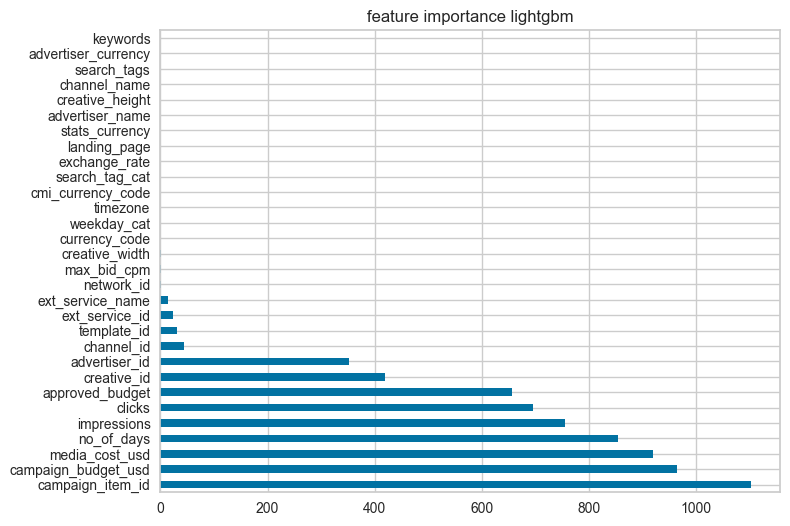

In [30]:
feat_imp=pd.Series(model.feature_importances_,index=bf_df.columns)
feat_imp.nlargest(30).plot(kind='barh',figsize=(8,6))
plt.title('feature importance lightgbm')
plt.show()

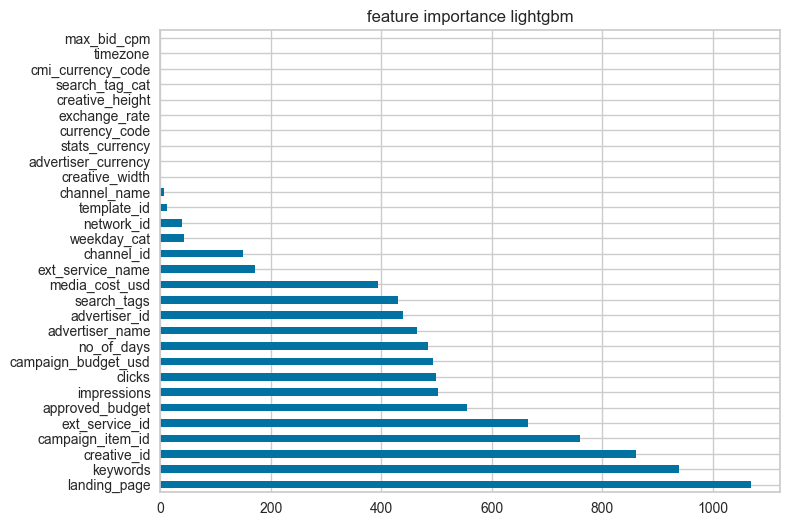

In [40]:
feat_imp=pd.Series(model.feature_importances_,index=bf_df.columns)
feat_imp.nlargest(30).plot(kind='barh',figsize=(8,6))
plt.title('feature importance lightgbm')
plt.show()

### We compared the lightgbm predictions for both the data, the normal data and the embeddings. The clusters Through Embeddings captured more data compared to the normal one. It captured more data along side what the normal model did. So, we're choosing that. 

In [41]:
bf_df['clusters']=clusters_predict

In [89]:
tables={}
temp=pd.DataFrame()
for i in range(0,3):
    name="tab_"+str(i)
    nm=new.loc[bf_df['clusters']==i]
    tables[name]=nm
print(tables)

{'tab_0':        campaign_item_id  no_of_days  ext_service_id ext_service_name  \
1                  2733           8              16            DV360   
4                  2733          11               4       Google Ads   
5                  2766          53               4       Google Ads   
6                  2766          54               4       Google Ads   
7                  2766          55              16            DV360   
...                 ...         ...             ...              ...   
69169              3959           4              16            DV360   
69170              3959           5              16            DV360   
69173              3960           1               4       Google Ads   
69178              3960           6              16            DV360   
69188              3960           2               4       Google Ads   

       creative_id  creative_width  creative_height  \
1             1000           300.0            250.0   
4             1

### Seperating the data by clusters. 

In [ ]:
## dt1=pd.DataFrame()
dt2={}
vals=[]
for col in num_col:
    dt1=pd.DataFrame()
    for table in tables:
        vals=[]
        new_n=str(table)+"_"+str(col)
        vals.append(tables[table][col].sum())
        vals.append(max(tables[table][col]))
        vals.append(min(tables[table][col]))
        vals.append(tables[table][col].mean())
        vals.append(tables[table][col].median())
        vals.append(tables[table][col].std())
        vals.append(tables[table][col].var())
        dt1[new_n]=vals
    dt2[col]=dt1
for col in num_col:
    dt2[col].index=['sum','max','min','mean','median','standard deviation','variance']

In [62]:
dt2

{'no_of_days':                     tab_0_no_of_days  tab_1_no_of_days  tab_2_no_of_days
 sum                    709973.000000     637228.000000     575256.000000
 max                       118.000000        118.000000         89.000000
 min                         0.000000          0.000000          0.000000
 mean                       35.461416         27.698340         22.251035
 median                     23.000000         20.000000         19.000000
 standard deviation         32.621276         25.628008         16.936652
 variance                 1064.147625        656.794804        286.850177,
 'creative_width':                     tab_0_creative_width  tab_1_creative_width  \
 sum                         4.510200e+06          6.170400e+06   
 max                         3.000000e+02          3.000000e+02   
 min                         0.000000e+00          0.000000e+00   
 mean                        2.252735e+02          2.682083e+02   
 median                      3.000000e+0

### We're printing all the key variables for each feature for each cluster in an easy to read format. i.e ['sum','max','min','mean','median','standard deviation','variance']

In [65]:
cat_cols=['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords']

In [66]:
dt1=pd.DataFrame()
dt3={}
vals=[]
for col in cat_cols:
    dt1=pd.DataFrame()
    for table in tables:
        vals=[]
        new_n=str(table)+"_"+str(col)
        vals.append(tables[table][col].value_counts())
        dt1[new_n]=vals
    dt3[col]=dt1
for col in cat_cols:
    dt3[col].index=['counts']

In [67]:
dt3

{'campaign_item_id':                                    tab_0_campaign_item_id  \
 counts  2766    4786
 3181    1118
 3161     942
 3178   ...   
 
                                    tab_1_campaign_item_id  \
 counts  2766    2335
 3218     997
 3159     853
 3161   ...   
 
                                    tab_2_campaign_item_id  
 counts  3159    1423
 3150    1375
 3188    1369
 3149   ...  ,
 'ext_service_id':                                      tab_0_ext_service_id  \
 counts  16     11408
 4       8600
 128       13
 Name: e...   
 
                                    tab_1_ext_service_id  \
 counts  128    23006
 Name: ext_service_id, dtype: int64   
 
                                      tab_2_ext_service_id  
 counts  4     14337
 16    11516
 Name: ext_service_id, ...  ,
 'ext_service_name':                                    tab_0_ext_service_name  \
 counts  DV360           11408
 Google Ads       8600
 Fa...   
 
                                    tab_1_ext_service

### We're printing the value_counts of the data in categorical features to analyse how the data is distributed among them.

In [90]:
# Table counts
# cluster 0 : approx 20000
# cluster 1 : approx 23000
# cluster 2 : approx 25000

In [76]:
print(dt3['stats_currency']['tab_0_stats_currency']['counts'])

AED    10743
USD     4871
INR     4099
EGP      306
SGD        2
Name: stats_currency, dtype: int64


In [81]:
for ele in cat_cols:
    for j in list(dt3[ele].columns):
        print(j)
        print(dt3[ele][j]['counts'])
        print()
        print()

tab_0_campaign_item_id
2766    4786
3181    1118
3161     942
3178     923
3222     865
        ... 
3107       3
3545       2
3486       2
2733       2
3444       1
Name: campaign_item_id, Length: 139, dtype: int64


tab_1_campaign_item_id
2766    2335
3218     997
3159     853
3161     794
3150     793
        ... 
3545       1
3486       1
3444       1
3559       1
3162       1
Name: campaign_item_id, Length: 140, dtype: int64


tab_2_campaign_item_id
3159    1423
3150    1375
3188    1369
3149    1325
3182    1320
        ... 
3049       3
3047       3
3057       1
3445       1
2850       1
Name: campaign_item_id, Length: 87, dtype: int64


tab_0_ext_service_id
16     11408
4       8600
128       13
Name: ext_service_id, dtype: int64


tab_1_ext_service_id
128    23006
Name: ext_service_id, dtype: int64


tab_2_ext_service_id
4     14337
16    11516
Name: ext_service_id, dtype: int64


tab_0_ext_service_name
DV360           11408
Google Ads       8600
Facebook Ads       13
Name: ex

### Key findings:
### 1. Volume wise the clusters follow the following order 2>1>0 although there is'nt much difference between them. i.e approx 25k>23k>20k in numbers.
### 2. There is clear ordering in all the numerical features. Mean value of all the features follow the order of 0>1>2 possibly due to the difference in income. We're telling this bcoz cluster '0' bought in for keywords of expensive and exquisite jewellery meanwhile cluster '2' went in for more of casual and affordable section with cluster '1' being in between them. so, the distinction is probably due to high income or due to the fact that marketting was targetted specifically considering these three section of customers.
### 3. Every other categorical variable is equally distributed when it comes to different values they have in each but are just distributed differently. For ex in all 3 clusters for variable 1 we have value 1, value 2, value 3 but they may be having different number of each values leading to different clusters. 
### 4. In order to analyse each categorical feature we must be clear of it's application and get some domain knowledge of the problem to apply any complex technique to get insights as applying conventional mathematical approaches to all the possibilities is very tiresome and not fruitful.
